#### Load packages

In [2]:
import sys
import os
import importlib
import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers
import math

import nibabel as nib
import numpy as np
# Get the absolute path of the parent directory
project_path = os.path.abspath("..")  
sys.path.append(project_path)
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

import pyMEAL
import pyMEAL.builder_block as BD
import tensorflow as tf
from tensorflow import keras
import pyMEAL.builder_block as BD
import pyMEAL.basics as bcs
importlib.reload(bcs)
from pyMEAL.builder_block import (
    FlipAugmentation, RotateAugmentation, CropAugmentation, IntensityAugmentation
)
import pyMEAL.utils as utils
importlib.reload(utils)
import pyMEAL.plotting as plot
importlib.reload(plot)

<module 'pyMEAL.plotting' from 'C:\\Users\\user\\Desktop\\pyMEAL\\pyMEAL\\pyMEAL\\plotting.py'>

In [3]:
# Environment configuration
bcs.configure_environment("2,1")
bcs.set_random_seed(42)

In [4]:
# Configuration at the top of your script
LOG_DIR = "./save_log/"  # Using ./ for current directory is more conventional
MODEL_DIR = "./saved_models/"
os.makedirs(LOG_DIR, exist_ok=True)  # Creates directory if it doesn't exist
os.makedirs(MODEL_DIR, exist_ok=True)  # Creates directory if it doesn't exist

#### Load data

In [5]:
DATA_DIR = os.path.abspath("../CTScan data/processed_data")

TRAIN_PATHS = {
    "input": os.path.join(DATA_DIR, "proceed_CT", "tr"),
    "target": os.path.join(DATA_DIR, "proceed_T1", "tr")
}

VAL_PATHS = {
    "input": os.path.join(DATA_DIR, "proceed_CT", "te"),
    "target": os.path.join(DATA_DIR, "proceed_T1", "te")
}

In [6]:
# Dataset and model params
INPUT_SHAPE = (128, 128, 64, 1)
TARGET_SHAPE = INPUT_SHAPE[:3]
BATCH_SIZE = 1

#### Training

In [7]:
def train_model():
    train_dataset = BD.create_dataset(TRAIN_PATHS['input'], TRAIN_PATHS['target'])
    val_dataset = BD.create_dataset(VAL_PATHS['input'], VAL_PATHS['target'])

    model = BD.build_multistream_model(INPUT_SHAPE)
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-4),
        loss=bcs.combined_loss,
        metrics=['mae']
    )

    callbacks = [
        keras.callbacks.ModelCheckpoint(
            os.path.join(MODEL_DIR, "best_model_BD.keras"),
            save_best_only=True,
            monitor='val_loss',
            mode='min'
        ),
        keras.callbacks.CSVLogger(os.path.join(LOG_DIR, "training_log_BD.csv")),
        keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            mode='min'
        )
    ]

    history = model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=300,
        callbacks=callbacks,
        verbose=1
    )

    avg_psnr, avg_ssim = pr.evaluate_model(model, val_dataset, INPUT_SHAPE)
    print(f"Validation Metrics - PSNR: {avg_psnr:.4f}, SSIM: {avg_ssim:.4f}")
    return model


if __name__ == "__main__":
    trained_model = train_model()

    custom_objects = {
        'FlipAugmentation': FlipAugmentation,
        'RotateAugmentation': RotateAugmentation,
        'CropAugmentation': CropAugmentation,
        'IntensityAugmentation': IntensityAugmentation,
        'combined_loss': bcs.combined_loss,
        'ssim_loss': bcs.ssim_loss
    }

    loaded_model = tf.keras.models.load_model(
        os.path.join(MODEL_DIR, "best_model_BD.h5"),
        custom_objects=custom_objects,
        compile=False
    )
    loaded_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-4),
        loss=pr.combined_loss,
        metrics=['mae']
    )

    val_dataset = BD.create_dataset(VAL_PATHS['input'], VAL_PATHS['target'])
    avg_psnr, avg_ssim = bcs.evaluate_model(loaded_model, val_dataset, INPUT_SHAPE)
    print(f"Loaded Model Metrics - PSNR: {avg_psnr:.4f}, SSIM: {avg_ssim:.4f}")


#### Load model

In [8]:
custom_objects = {
    'FlipAugmentation': FlipAugmentation,
    'RotateAugmentation': RotateAugmentation,
    'CropAugmentation': CropAugmentation,
    'IntensityAugmentation': IntensityAugmentation
}

In [9]:
# load models
load_model = os.path.join(MODEL_DIR, "builder1_mode1l1abW512_1_11211z1p1rt_.h5")
##
print("Checking file existence at:", load_model)
print("File exists:" , os.path.exists(load_model))
##
trained_modelBD = tf.keras.models.load_model(load_model, custom_objects= custom_objects, compile=False)

Checking file existence at: ./saved_models/builder1_mode1l1abW512_1_11211z1p1rt_.h5
File exists: True


In [10]:
input_shape = INPUT_SHAPE 
target_shape = input_shape[:3]  
batch_size = 1
## validation dataset
val_dataset = utils.create_dataset(VAL_PATHS["input"],VAL_PATHS["target"],target_shape,batch_size)

In [11]:
# for plotting
plt.rc('text', usetex=True)
plt.rc('font', family='serif', size=15)
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)

#### Load the CT image as input

In [12]:
# Load image data correctly by calling the method with parentheses
input_data = nib.load('./CTScan data/processed_data/proceed_CT/te/sub-OAS30001_sess-d3132_CT.nii.gz').get_fdata()
truth_data = nib.load('./CTScan data/processed_data/proceed_T1/te/sub-OAS30001_ses-d3132_T1w_be.nii.gz').get_fdata()


input_shape = (128, 128, 64, 1)
target_shape = input_shape[:3]  
batch_size = 1
# target_shape 
ground_truth= bcs.resize_volume(truth_data, target_shape)
ground_truth = (ground_truth - np.min(ground_truth)) / (np.max(ground_truth) - np.min(ground_truth))

#### Apply augmentation and windowing

In [13]:
# Apply windowing
windowed_image = bcs.apply_windowing(input_data, 40, 80)

# Proceed with resizing and normalization as intended
resized_image = bcs.resize_volume(windowed_image, target_shape)
normalized_image = (resized_image - np.min(resized_image)) / (np.max(resized_image) - np.min(resized_image))

input_tensor = tf.convert_to_tensor(normalized_image)
# Apply selected augmentations
augmented_Rotate = bcs.apply_augmentation(input_tensor, apply_rotate=True, apply_crop=False, apply_intensity=False, apply_flip=False)
# Convert to tensor and add batch/channel dimensions
##
input_tensor = tf.convert_to_tensor(normalized_image)[tf.newaxis, ..., tf.newaxis]
reshaped_tensor = tf.reshape(input_tensor, [1, normalized_image.shape[0], normalized_image.shape[1], normalized_image.shape[2], 1])
augmented_Crop = bcs.apply_augmentation(input_tensor, apply_rotate=False, apply_crop=True, apply_intensity=False, apply_flip=False)
##
input_tensor = tf.convert_to_tensor(normalized_image)
augmented_Flip = bcs.apply_augmentation(input_tensor, apply_rotate=False, apply_crop=False, apply_intensity=False, apply_flip=True)
augmented_intensity = bcs.apply_augmentation(input_tensor, apply_rotate=False, apply_crop=False, apply_intensity=True, apply_flip=False)

#### Visualize different augmentation

Rotate Shape: (128, 128, 64)


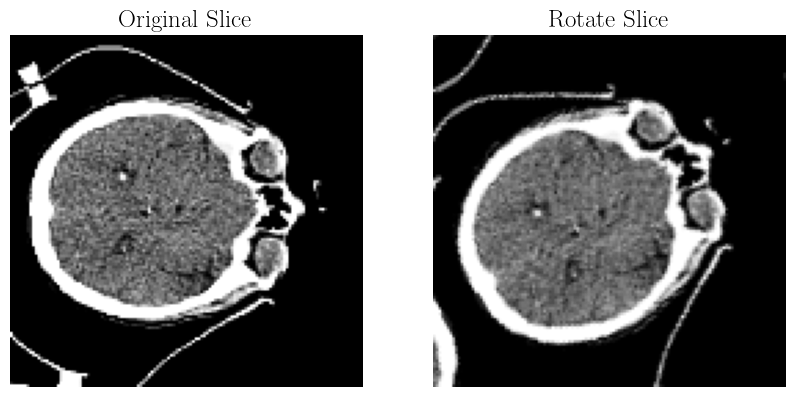

Crop Shape: (128, 128, 64)


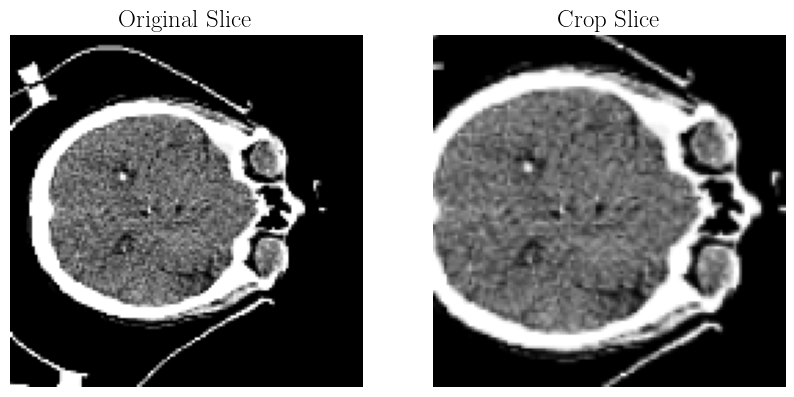

Flip Shape: (128, 128, 64)


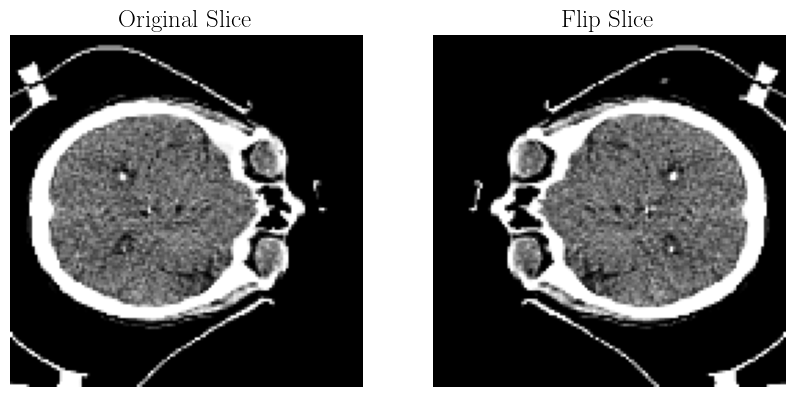

Intensity Shape: (128, 128, 64)


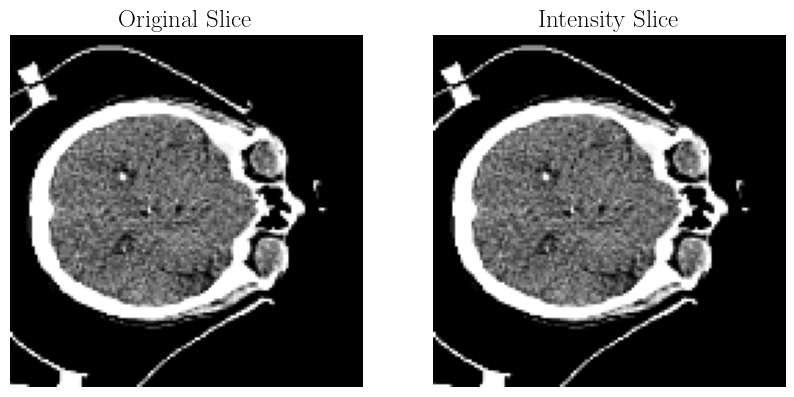

In [14]:
plot.visualize_augmentation(normalized_image, augmented_Rotate, slice_index=32, name='Rotate')
plot.visualize_augmentation(normalized_image, augmented_Crop, slice_index=32, name='Crop')
plot.visualize_augmentation(normalized_image, augmented_Flip, slice_index=32, name='Flip')
plot.visualize_augmentation(normalized_image, augmented_intensity, slice_index=32, name='Intensity')


#### Predict T1w image from CT input

In [15]:
m1= trained_modelBD.predict(tf.expand_dims(augmented_Rotate, axis=0))
m2= trained_modelBD.predict(tf.expand_dims(np.squeeze(augmented_Crop), axis=0))
m3= trained_modelBD.predict(tf.expand_dims(augmented_Flip, axis=0))
m4= trained_modelBD.predict(tf.expand_dims(augmented_intensity, axis=0))
m5= trained_modelBD.predict(tf.expand_dims(input_tensor, axis=0))

1/1 [==============================] - 51s 51s/step


#### Show predicted image, Heatmap,Histogram of Pixel difference

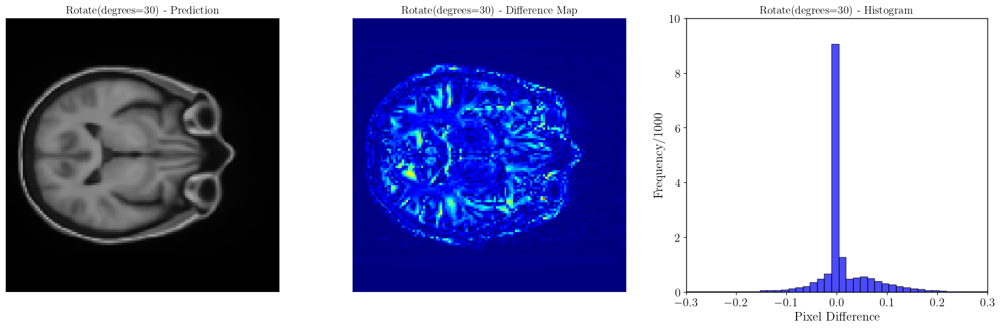

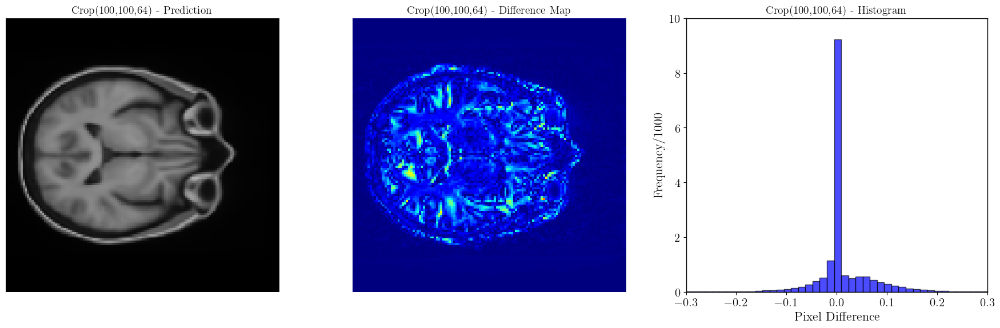

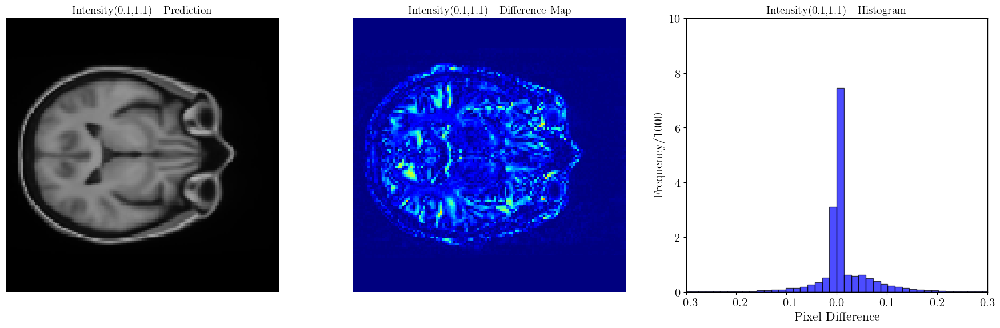

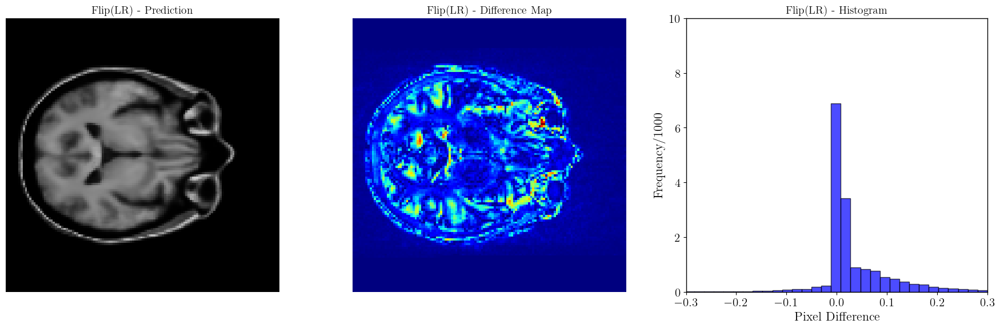

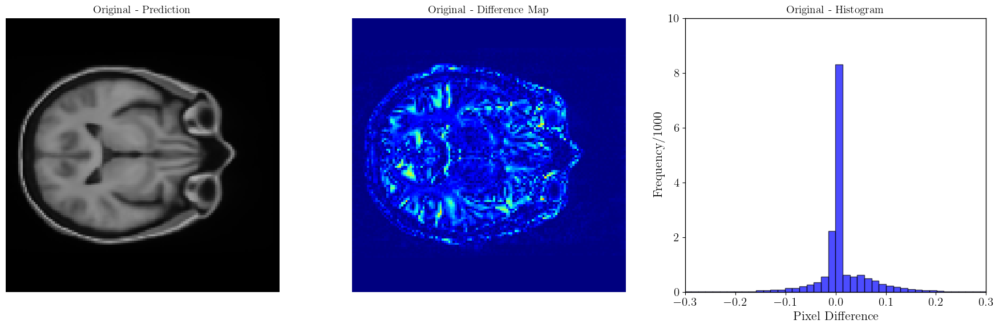

In [16]:
pred_list = [m1, m2, m3, m4, m5]
pred_names = ['Rotate(degrees=30)', 'Crop(100,100,64)', 'Intensity(0.1,1.1)', 'Flip(LR)', 'Original']
plot.visualize_predictions_with_difference(pred_list, pred_names, ground_truth, normalized_image, batch_index=0)


#### Performance assessment

In [17]:
pred_list = [m1, m2, m3, m4, m5]
pred_names = ['Rotate(degrees=30)', 'Crop(100,100,64)', 'Intensity(0.1,1.1)', 'Flip(LR)', 'Original']

psnr_scores, ssim_scores = utils.compute_psnr_ssim(
    predictions=pred_list,
    prediction_names=pred_names,
    ground_truth=ground_truth,
    original_image=normalized_image,
    batch_index=0,
    save_dir='results/figures',    
    visualize=False                
)

# Print Summary Table
print("\nSummary of PSNR and SSIM Scores:\n")
print("{:<25} {:<10} {:<10}".format("Prediction", "PSNR", "SSIM"))
print("-" * 45)
for name, p_val, s_val in zip(pred_names, psnr_scores, ssim_scores):
    print("{:<25} {:<10.4f} {:<10.4f}".format(name, p_val, s_val))



Summary of PSNR and SSIM Scores:

Prediction                PSNR       SSIM      
---------------------------------------------
Rotate(degrees=30)        25.3790    0.8640    
Crop(100,100,64)          25.4749    0.8634    
Intensity(0.1,1.1)        25.6881    0.8685    
Flip(LR)                  22.2496    0.7233    
Original                  25.7172    0.8692    


In [18]:
val_dataset_bd = bcs.create_dataset(VAL_PATHS["input"],VAL_PATHS["target"],input_shape=INPUT_SHAPE,
    target_shape=TARGET_SHAPE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

In [19]:
# m1

Processing Batches:   0%|                                                                       | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 52s 52s/step



Batch 0 Samples:   0%|                                                                           | 0/1 [00:00<?, ?it/s]

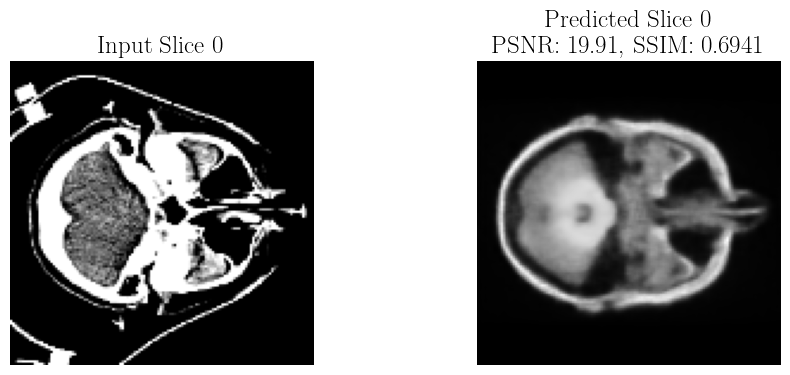

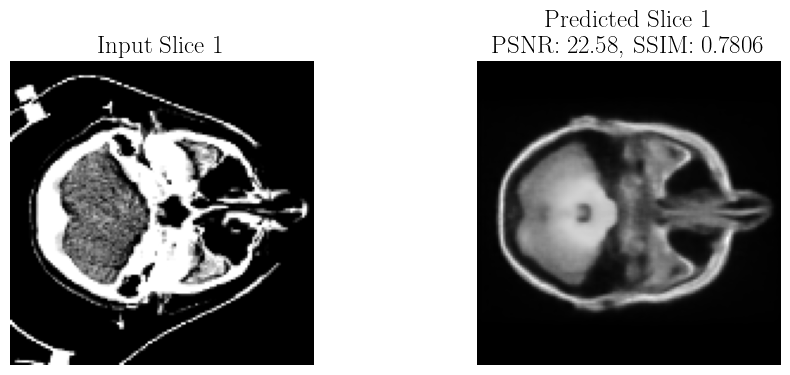

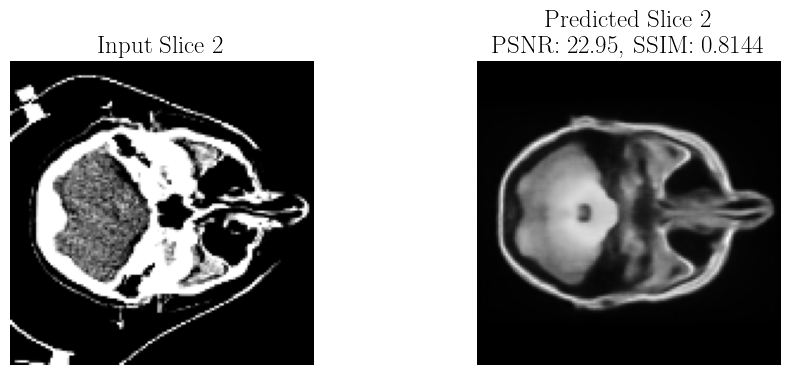

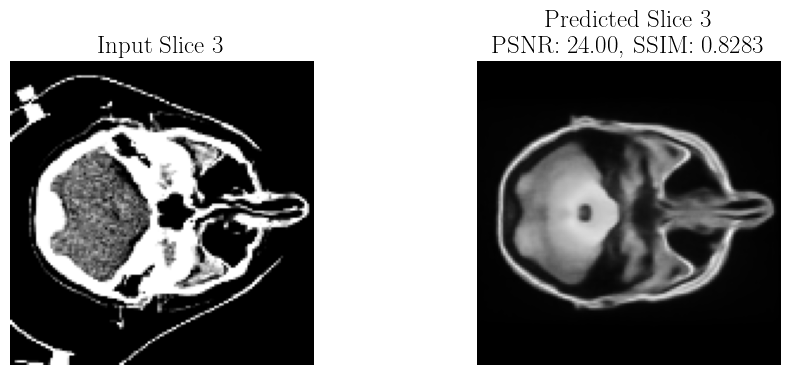

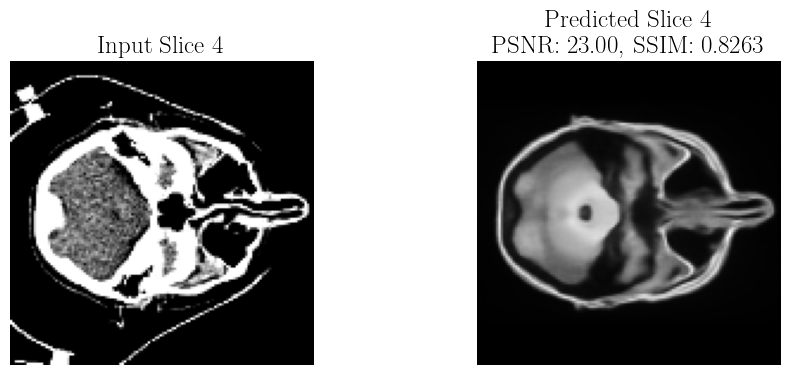

...

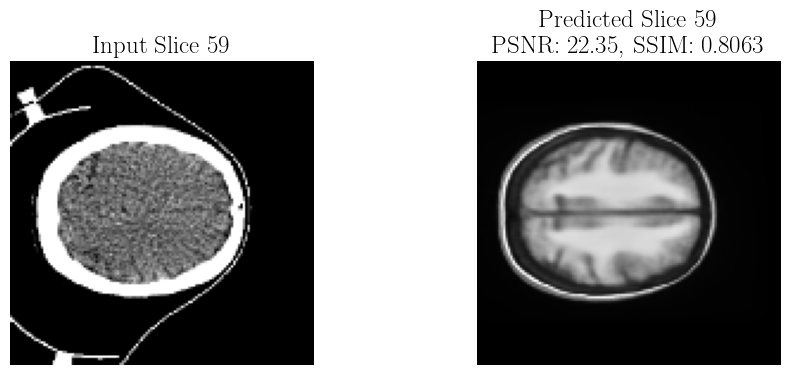

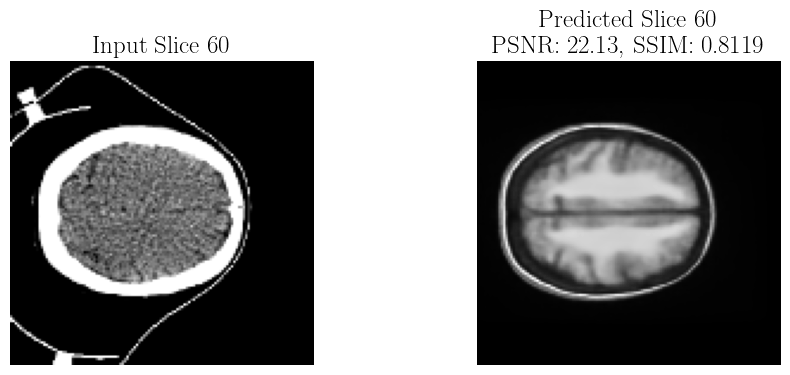

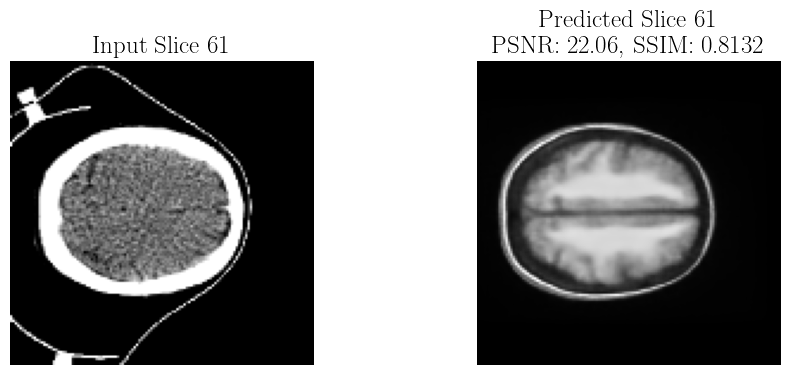

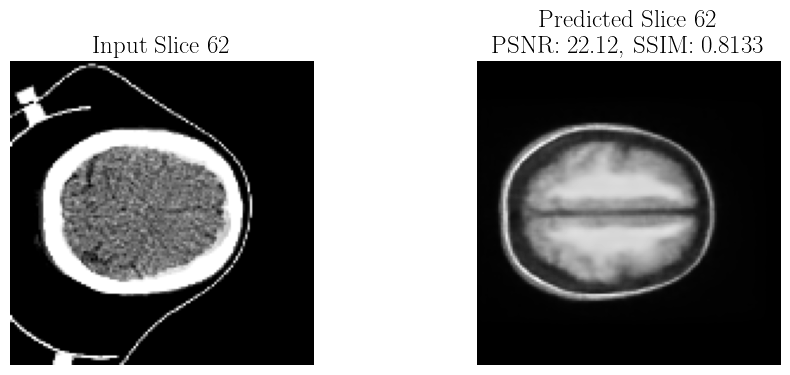

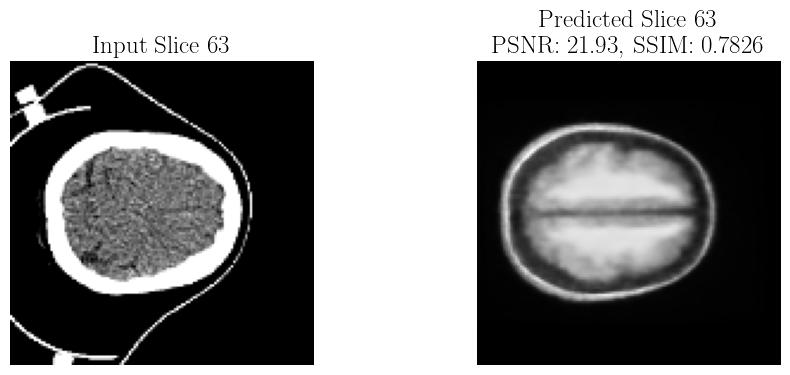


Processing Batches:  10%|██████▏                                                       | 1/10 [03:16<29:27, 196.43s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  20%|████████████▍                                                 | 2/10 [04:06<14:44, 110.54s/it]

1/1 [==============================] - 51s 51s/step



Processing Batches:  30%|██████████████████▉                                            | 3/10 [04:58<09:44, 83.46s/it]

1/1 [==============================] - 49s 49s/step



Processing Batches:  40%|█████████████████████████▏                                     | 4/10 [05:47<07:00, 70.05s/it]

1/1 [==============================] - 49s 49s/step



Processing Batches:  50%|███████████████████████████████▌                               | 5/10 [06:37<05:13, 62.62s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  60%|█████████████████████████████████████▊                         | 6/10 [07:26<03:52, 58.20s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  70%|████████████████████████████████████████████                   | 7/10 [08:17<02:46, 55.66s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  80%|██████████████████████████████████████████████████▍            | 8/10 [09:06<01:47, 53.76s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  90%|████████████████████████████████████████████████████████▋      | 9/10 [09:56<00:52, 52.57s/it]

1/1 [==============================] - 48s 48s/step



Processing Batches: 100%|██████████████████████████████████████████████████████████████| 10/10 [10:45<00:00, 64.53s/it]


In [21]:
# aug_type='BD'
avg_psnr, avg_ssim, psnr_values, ssim_values = plot.visualize_plot(trained_modelBD, val_dataset_bd, aug_type = 'BD', visualize=True, view_type='all')

In [25]:
[avg_psnr, avg_ssim]

[23.232959141365274, 0.853499087238801]

In [24]:
print([psnr_values, ssim_values])

[[23.39972927435, 21.16247508307061, 22.346621244724094, 25.75002119861771, 22.62239450756099, 24.176581946947053, 21.980702299952576, 24.918083328704203, 23.946526415102902, 22.026456114622572], [0.860652724662424, 0.8204190505105861, 0.8524070920658859, 0.868816314471299, 0.8356138034786232, 0.8780059783520655, 0.8708626429859737, 0.8807805578888024, 0.8504092140884578, 0.8170234938838912]]
